<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/California_Housing_Prices)_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# California Housing Prices Dataset

# Introduction and Key Insights

---

Unlocking the California Housing Market: A Data Story
We dived into the California Housing Prices dataset, a fascinating snapshot of the 1990 real estate market containing over 20,000 districts (blocks). The goal was simple but ambitious: understand what really drives property values and build an AI model to predict them.

1. Location is Everything (Literally)
The age-old real estate mantra—"Location, location, location"—was statistically proven here. Our analysis confirmed that proximity to the ocean is a massive price differentiator.
those "Near Bay" or "<1H Ocean".
2. Statistical Proof: We ran an ANOVA test which returned a p-value of effectively zero, confirming that these price differences aren't random luck; the ocean view premium is real.
2. The Income Effect
Unsurprisingly, Median Income turned out to be the single strongest predictor of house prices, boasting a correlation of 0.69. This creates a clear narrative: wealthier neighborhoods command higher prices, overshadowing other factors like the age of the house or total population.

3. Quality Over Quantity (Feature Engineering)
Raw numbers like "Total Rooms" were misleading—a mansion and a crowded apartment complex might both have 100 rooms. By engineering "ratio" features, we found deeper truths:

Bedrooms per Room: This had a negative correlation with price. Higher ratios often indicate overcrowding or lower-end housing, which tends to lower value.
Rooms per Household: Larger homes (more rooms per family) generally correlated with higher values.
4. Taming the Skew
We discovered that house prices were heavily "right-skewed" (a few mega-expensive houses distorted the average). By applying a Log Transformation, we normalized the data into a bell curve. This technical trick was crucial—it allowed our Machine Learning model to "see" patterns more clearly without being confused by outliers.

6. The AI Verdict
We trained a Random Forest Regressor to predict prices. The results were impressive:

Accuracy: The model achieved an R² score of 80.8%, meaning it can explain over 80% of the price variation.
Precision: The average error was about $31,338. $500,000, getting within a $31k margin is a solid result for a 30-year-old dataset.
In Summary: While complex algorithms help us predict the exact number, the core truth is simple: Income and Ocean Proximity are the kings of California real estate. If you want high value, look for a high-income neighborhood within an hour of the coast.

---

In [41]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [12]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d camnugent/california-housing-prices

# Unziping the downloaded file
!unzip california-housing-prices.zip

Saving kaggle.json to kaggle (1).json
Dataset URL: https://www.kaggle.com/datasets/camnugent/california-housing-prices
License(s): CC0-1.0
  0% 0.00/400k [00:00<?, ?B/s]
100% 400k/400k [00:00<00:00, 828MB/s]
Archive:  california-housing-prices.zip
  inflating: housing.csv             


In [13]:
df = pd.read_csv('housing.csv')
df.head(11)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
5,-122.25,37.85,52.0,919.0,213.0,413.0,193.0,4.0368,269700.0,NEAR BAY
6,-122.25,37.84,52.0,2535.0,489.0,1094.0,514.0,3.6591,299200.0,NEAR BAY
7,-122.25,37.84,52.0,3104.0,687.0,1157.0,647.0,3.1200,241400.0,NEAR BAY
8,-122.26,37.84,42.0,2555.0,665.0,1206.0,595.0,2.0804,226700.0,NEAR BAY
9,-122.25,37.84,52.0,3549.0,707.0,1551.0,714.0,3.6912,261100.0,NEAR BAY


In [14]:
df.tail(11)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20629,-121.39,39.12,28.0,10035.0,1856.0,6912.0,1818.0,2.0943,108300.0,INLAND
20630,-121.32,39.29,11.0,2640.0,505.0,1257.0,445.0,3.5673,112000.0,INLAND
20631,-121.40,39.33,15.0,2655.0,493.0,1200.0,432.0,3.5179,107200.0,INLAND
20632,-121.45,39.26,15.0,2319.0,416.0,1047.0,385.0,3.1250,115600.0,INLAND
20633,-121.53,39.19,27.0,2080.0,412.0,1082.0,382.0,2.5495,98300.0,INLAND
20634,-121.56,39.27,28.0,2332.0,395.0,1041.0,344.0,3.7125,116800.0,INLAND
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [15]:
df.shape

(20640, 10)

In [16]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [17]:
df.dtypes

,0
longitude,float64
latitude,float64
housing_median_age,float64
total_rooms,float64
total_bedrooms,float64
population,float64
households,float64
median_income,float64
median_house_value,float64
ocean_proximity,object


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [19]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
longitude,20640.0,NaN,NaN,NaN,-119.569704,2.003532,-124.35,-121.8,-118.49,-118.01,-114.31
latitude,20640.0,NaN,NaN,NaN,35.631861,2.135952,32.54,33.93,34.26,37.71,41.95
housing_median_age,20640.0,NaN,NaN,NaN,28.639486,12.585558,1.0,18.0,29.0,37.0,52.0
total_rooms,20640.0,NaN,NaN,NaN,2635.763081,2181.615252,2.0,1447.75,2127.0,3148.0,39320.0
total_bedrooms,20433.0,NaN,NaN,NaN,537.870553,421.38507,1.0,296.0,435.0,647.0,6445.0
population,20640.0,NaN,NaN,NaN,1425.476744,1132.462122,3.0,787.0,1166.0,1725.0,35682.0
households,20640.0,NaN,NaN,NaN,499.53968,382.329753,1.0,280.0,409.0,605.0,6082.0
median_income,20640.0,NaN,NaN,NaN,3.870671,1.899822,0.4999,2.5634,3.5348,4.74325,15.0001
median_house_value,20640.0,NaN,NaN,NaN,206855.816909,115395.615874,14999.0,119600.0,179700.0,264725.0,500001.0
ocean_proximity,20640,5,<1H OCEAN,9136,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
df.isnull().sum()

,0
longitude,0
latitude,0
housing_median_age,0
total_rooms,0
total_bedrooms,207
population,0
households,0
median_income,0
median_house_value,0
ocean_proximity,0


In [21]:
df.drop('total_bedrooms', axis = 1, inplace = True)

In [22]:
df.isnull().sum()

,0
longitude,0
latitude,0
housing_median_age,0
total_rooms,0
population,0
households,0
median_income,0
median_house_value,0
ocean_proximity,0


In [23]:
df.duplicated().sum()

np.int64(0)

# Statistical Analysis


--- 3. DOES THE OCEAN MATTER? (ANOVA TEST) ---
ANOVA P-Value: 0.0000e+00
✅ RESULT: Location significantly affects House Price (Real Correlation).


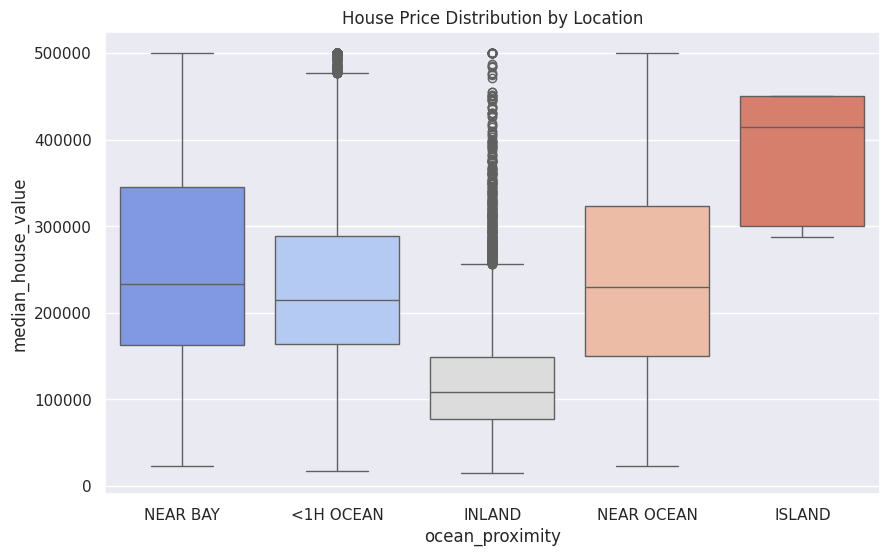

In [36]:
print("\n--- 3. DOES THE OCEAN MATTER? (ANOVA TEST) ---")

# Question: Is the price difference between 'Inland' and 'Near Ocean' statistically significant?
groups = df['ocean_proximity'].unique()
price_groups = [df[df['ocean_proximity'] == g]['median_house_value'] for g in groups]

f_stat, p_val = stats.f_oneway(*price_groups)

print(f"ANOVA P-Value: {p_val:.4e}")
if p_val < 0.05:
    print("✅ RESULT: Location significantly affects House Price (Real Correlation).")
else:
    print("❌ RESULT: Location doesn't matter (Random Chance).")

# Visualizing the Location Bias
plt.figure(figsize=(10, 6))
sns.boxplot(x='ocean_proximity', y='median_house_value', data=df, palette='coolwarm')
plt.title('House Price Distribution by Location')
plt.show()

# Feature Engineering

In [35]:
from scipy import stats

print("--- 1. RESTORING & FIXING DATA ---")
# Reload to get 'total_bedrooms' back (since we shouldn't have dropped it!)
df = pd.read_csv('housing.csv')

# Impute missing bedrooms with the Median (Standard practice)
df['total_bedrooms'].fillna(df['total_bedrooms'].median(), inplace=True)
print("✅ Fixed missing 'total_bedrooms' with Median imputation.")

print("\n--- 2. CREATING REAL ESTATE METRICS ---")
# Raw numbers don't matter as much as Ratios for pricing
# 1. Rooms per Household (Is the house big?)
df['Rooms_per_Household'] = df['total_rooms'] / df['households']

# 2. Bedrooms per Room (Is it crowded?)
df['Bedrooms_per_Room'] = df['total_bedrooms'] / df['total_rooms']

# 3. Population per Household (Density)
df['Population_per_Household'] = df['population'] / df['households']

print("✅ Created 3 new Ratio Features (Rooms/HH, Bedrooms/Room, Pop/HH)")

--- 1. RESTORING & FIXING DATA ---
✅ Fixed missing 'total_bedrooms' with Median imputation.

--- 2. CREATING REAL ESTATE METRICS ---
✅ Created 3 new Ratio Features (Rooms/HH, Bedrooms/Room, Pop/HH)


--- 4. WHAT DRIVES THE PRICE? (CORRELATION) ---
Correlation with House Price:
median_house_value          1.000000
median_income               0.688075
Rooms_per_Household         0.151948
total_rooms                 0.134153
housing_median_age          0.105623
households                  0.065843
total_bedrooms              0.049457
Population_per_Household   -0.023737
population                 -0.024650
longitude                  -0.045967
latitude                   -0.144160
Bedrooms_per_Room          -0.233303
Name: median_house_value, dtype: float64


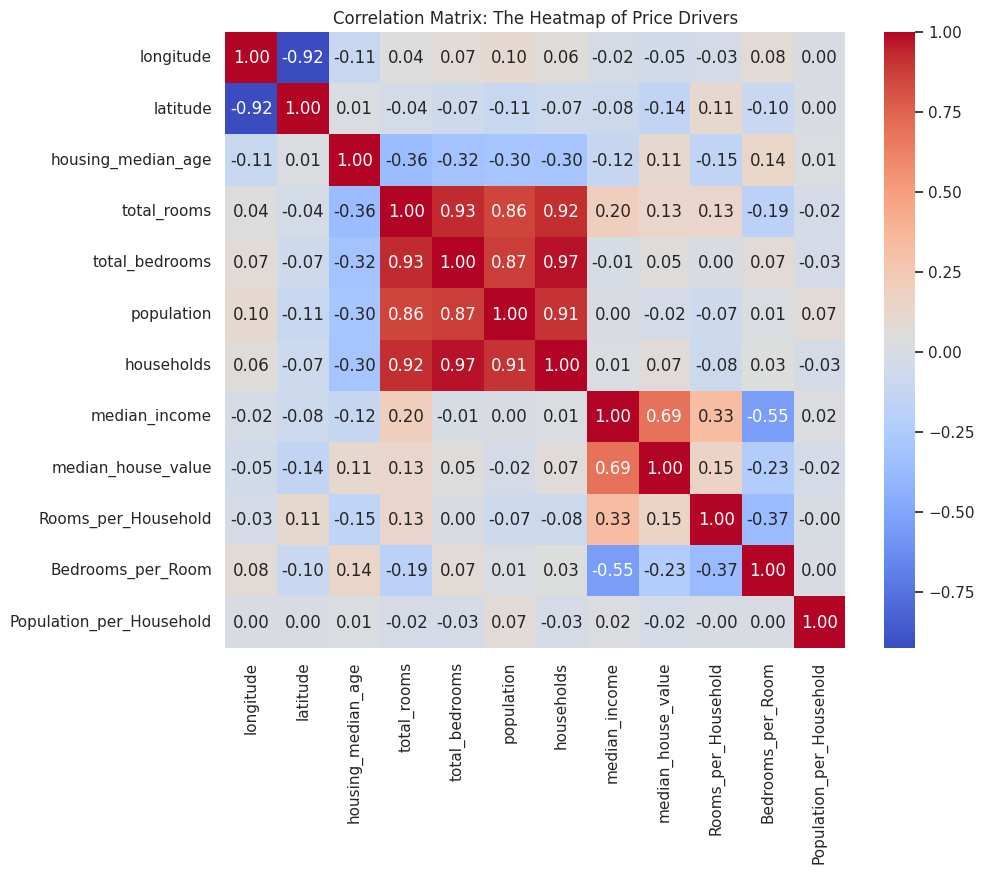


--- 5. CHECKING 'NORMALITY' (THE SKEW PROBLEM) ---


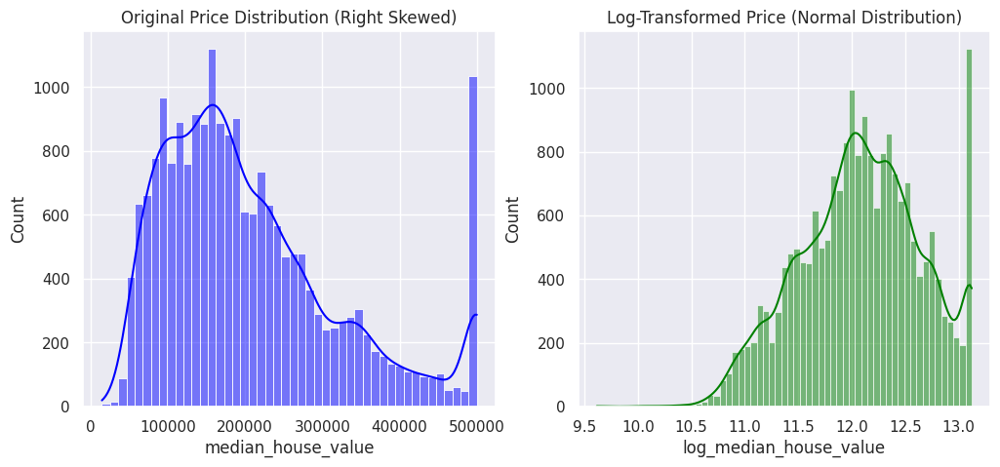

✅ Insight: Applying Log Transformation makes the data 'Normal', which improves ML model accuracy.


In [37]:
print("--- 4. WHAT DRIVES THE PRICE? (CORRELATION) ---")

# 1. Calculate Correlation with Target (Median House Value)
# We only care about how features correlate with 'median_house_value'
corr_matrix = df.corr(numeric_only=True)
price_corr = corr_matrix['median_house_value'].sort_values(ascending=False)

print("Correlation with House Price:")
print(price_corr)

# Visualize it
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Matrix: The Heatmap of Price Drivers")
plt.show()

print("\n--- 5. CHECKING 'NORMALITY' (THE SKEW PROBLEM) ---")

# 1. Plot Original Distribution
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
sns.histplot(df['median_house_value'], kde=True, color='blue')
plt.title("Original Price Distribution (Right Skewed)")

# 2. Apply Log Transformation (The Fix)
# This compresses the 'Mega Mansions' to make the data look more like a Bell Curve
df['log_median_house_value'] = np.log1p(df['median_house_value'])

plt.subplot(1, 2, 2)
sns.histplot(df['log_median_house_value'], kde=True, color='green')
plt.title("Log-Transformed Price (Normal Distribution)")
plt.show()

print("✅ Insight: Applying Log Transformation makes the data 'Normal', which improves ML model accuracy.")

# Univariate Analysis

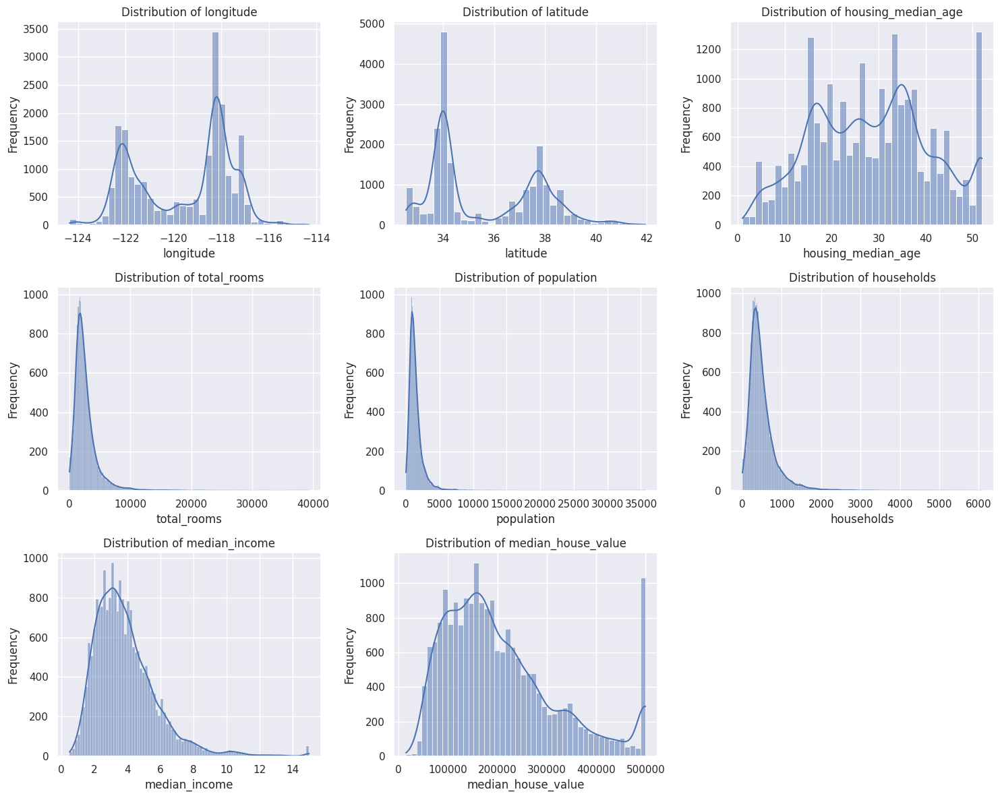

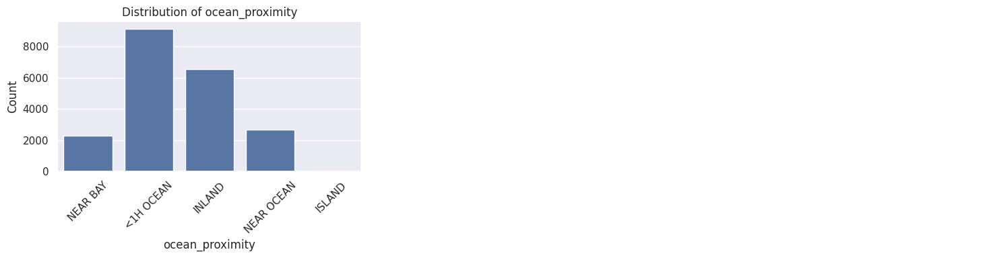

--- Categorical Value Counts ---

Value counts for ocean_proximity:
ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64


In [24]:
import math

# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Define grid size
    num_plots = len(numerical_cols)
    num_cols = 3  # You can change this to 2 or 4 if preferred
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()  # Flatten to 1D array for easy iteration

    # Iterate and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hidding any unused subplots (if total plots < grid cells)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()

if len(categorical_cols) > 0:
    # Define grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterate and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

    # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found.")

# Bivariate Analysis

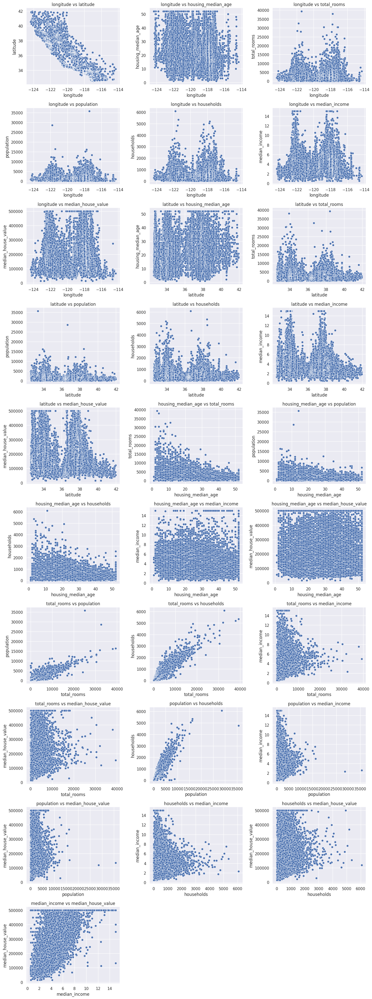

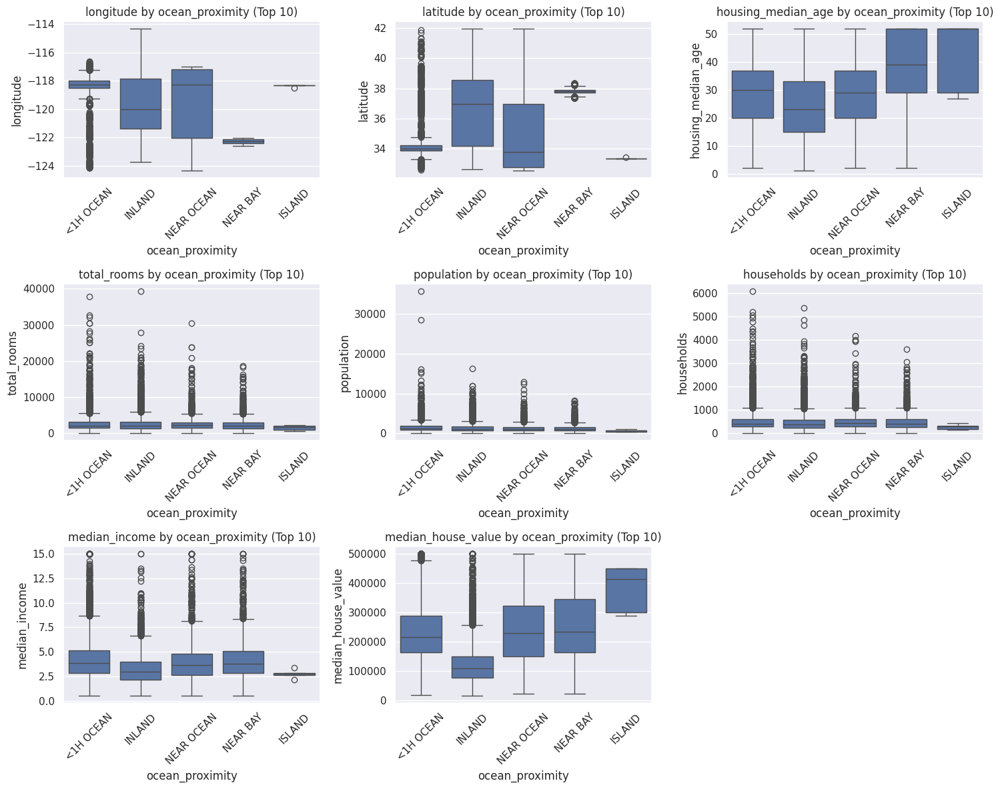

In [25]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generate all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    # Define grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    # Flatten axes for easy iteration.
    # Handle edge case where there is only 1 plot (axes is not an array)
    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterate through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generate all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    # Define grid size
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterate through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        # 1. Get top 10 categories based on frequency
        top_categories = df[cat_col].value_counts().nlargest(10).index.tolist()

        # 2. Filter data: Keep only top categories AND ensure numerical column is not NaN
        filtered_df = df[df[cat_col].isin(top_categories) & df[num_col].notnull()]

        # 3. Update 'order' to only include categories that exist in the filtered data
        # This prevents the ValueError where a category in 'order' has no data to plot
        valid_categories = [cat for cat in top_categories if cat in filtered_df[cat_col].unique()]

        if valid_categories:
            sns.boxplot(data=filtered_df, x=cat_col, y=num_col, ax=axes[i], order=valid_categories)
            axes[i].set_title(f'{num_col} by {cat_col} (Top 10)')
            axes[i].set_xlabel(cat_col)
            axes[i].set_ylabel(num_col)
            axes[i].tick_params(axis='x', rotation=45)
        else:
             axes[i].text(0.5, 0.5, "No valid data", ha='center', va='center')

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")


# Multivariate Analysis

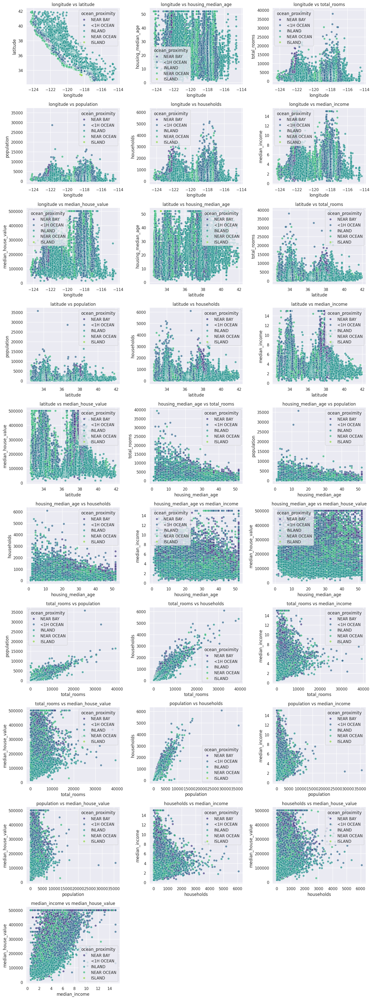


--- Multivariate Summary by 'ocean_proximity' (Loop Form) ---
Displaying mean values of numerical features for each category in 'ocean_proximity':

Category: NEAR BAY
longitude               -122.260694
latitude                  37.801057
housing_median_age        37.730131
total_rooms             2493.589520
population              1230.317467
households               488.616157
median_income              4.172885
median_house_value    259212.311790
dtype: float64
------------------------------
Category: <1H OCEAN
longitude               -118.847766
latitude                  34.560577
housing_median_age        29.279225
total_rooms             2628.343586
population              1520.290499
households               517.744965
median_income              4.230682
median_house_value    240084.285464
dtype: float64
------------------------------
Category: INLAND
longitude               -119.732990
latitude                  36.731829
housing_median_age        24.271867
total_rooms        

In [32]:
import itertools
import math

# --- 1. Multivariate Scatter Plots (Grid with Hue) ---

numerical_cols = df.select_dtypes(include=np.number).columns.tolist()
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# We need at least 2 numerical columns and 1 categorical column to create this plot
if len(numerical_cols) >= 2 and len(categorical_cols) >= 1:
    # Use the first categorical column for the hue
    hue_col = categorical_cols[0]

    # Generate all unique pairs of numerical columns
    num_pairs = list(itertools.combinations(numerical_cols, 2))

    # Define grid size
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    # Using consistent size (5x4 per plot) as previous analyses
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    # Iterate and plot
    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, hue=hue_col, ax=axes[i], alpha=0.7, palette='viridis')
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)
        # Legend handling: keeping it simple for grid
        # axes[i].legend(loc='upper right', title=hue_col)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough data for multivariate scatter plots.")


# --- 2. Multivariate Summary (Loop Form - Text Output) ---
# This mimics the 'Loop Form' textual analysis from previous steps

if len(categorical_cols) >= 1:
    hue_col = categorical_cols[0]
    print(f"\n--- Multivariate Summary by '{hue_col}' (Loop Form) ---")
    print(f"Displaying mean values of numerical features for each category in '{hue_col}':\n")

    # Loop through each category
    unique_cats = df[hue_col].unique()
    for cat in unique_cats:
        print(f"Category: {cat}")
        # Filter data and calculate mean
        subset = df[df[hue_col] == cat]
        print(subset[numerical_cols].mean())
        print("-" * 30)
else:
    print("No categorical column for loop summary.")

# Pairplot

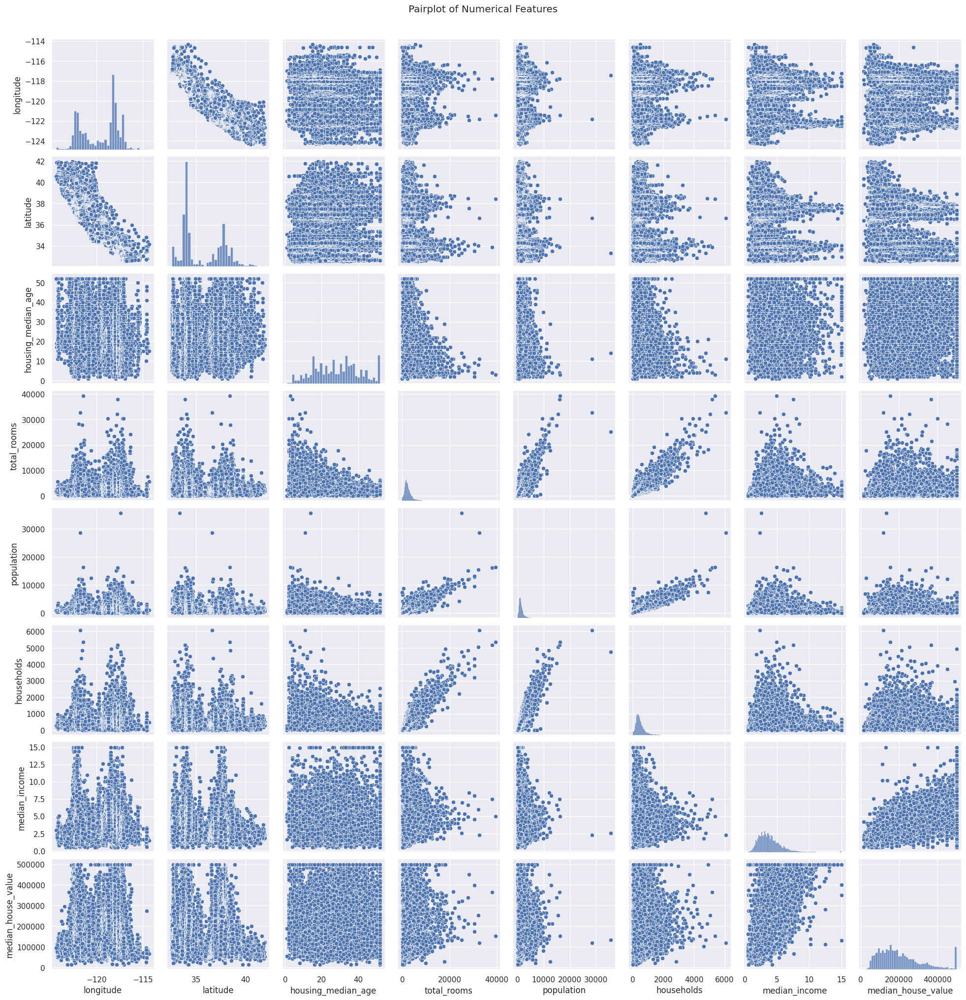

In [30]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# Heatmap

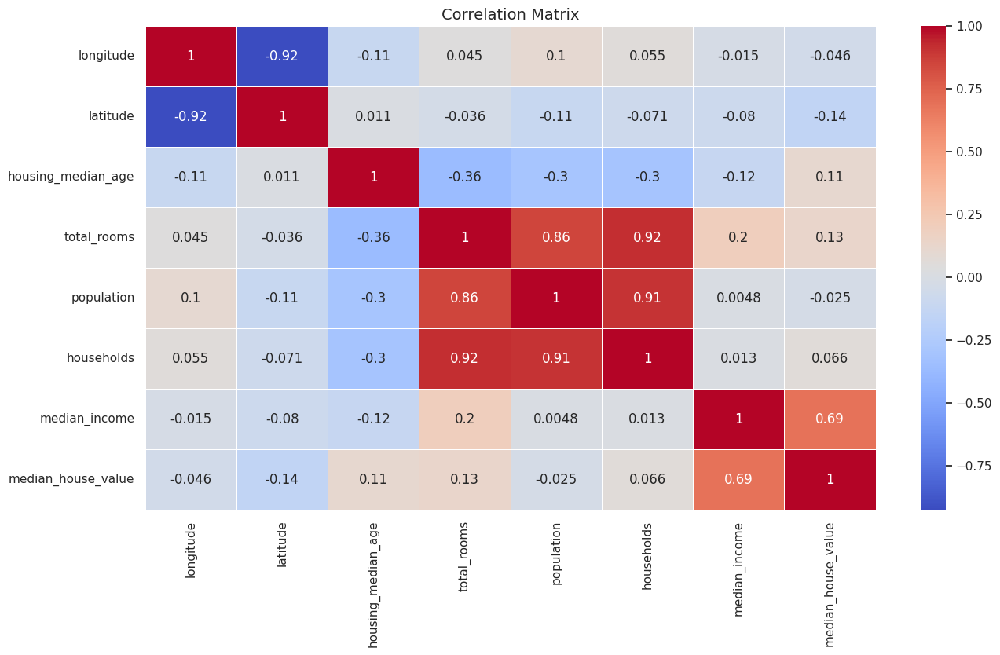

In [31]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Machine Learning

--- 6. CONVERTING TEXT TO NUMBERS ---
✅ Text column converted. New columns added:
Index(['ocean_proximity_INLAND', 'ocean_proximity_ISLAND',
       'ocean_proximity_NEAR BAY', 'ocean_proximity_NEAR OCEAN'],
      dtype='object')

--- 7. TRAINING THE AI MODEL ---
🎯 Model Performance:
   Average Error: $31,338
   Accuracy (R2): 80.8%


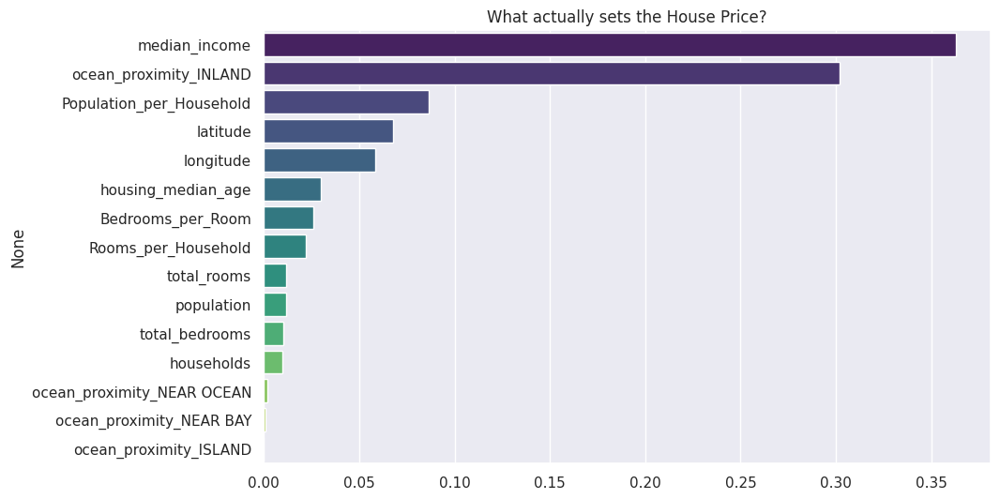

In [38]:
print("--- 6. CONVERTING TEXT TO NUMBERS ---")

# 1. One-Hot Encoding for 'ocean_proximity'
# This turns "NEAR BAY" into a column [1, 0, 0, 0]
df_ml = pd.get_dummies(df, columns=['ocean_proximity'], drop_first=True)

print("✅ Text column converted. New columns added:")
print(df_ml.columns[df_ml.columns.str.contains('ocean')])

# ==========================================
# PHASE 6: MACHINE LEARNING (RANDOM FOREST)
# ==========================================
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score

print("\n--- 7. TRAINING THE AI MODEL ---")

# 1. Define Features (X) and Target (y)
# We drop the 'median_house_value' (Target) and 'log_median_house_value' (Duplicate Target)
X = df_ml.drop(['median_house_value', 'log_median_house_value'], axis=1)
y = df_ml['log_median_house_value']

# 2. Split Data (80% Train, 20% Test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 3. Train Model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# 4. Evaluate
preds_log = model.predict(X_test)
preds_dollar = np.expm1(preds_log)
y_test_dollar = np.expm1(y_test)

mae = mean_absolute_error(y_test_dollar, preds_dollar)
r2 = r2_score(y_test_dollar, preds_dollar)

print(f"🎯 Model Performance:")
print(f"   Average Error: ${mae:,.0f}")
print(f"   Accuracy (R2): {r2*100:.1f}%")

# 5. Feature Importance
importances = pd.Series(model.feature_importances_, index=X.columns).sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=importances.values, y=importances.index, palette='viridis')
plt.title("What actually sets the House Price?")
plt.show()

# Thank You